## purpose
 - LSTMの精度を比較するためのベースライン作成
 
## TODOs
 - 毎日の売上の平均を事業×デバイス別に算出
 - 毎日の売上の平均と実測値のRMSEを算出

### 事業×デバイス別のデータ作成

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

In [9]:
df = pd.read_csv('train_data.csv').sort_values('dt')

In [10]:
df.head()

,Unnamed: 0,dt,holiday_flg,day_of_week,biz_category,category,uu,nontax_amount,arppu,nth_week
9305,9305,2017-01-01,True,7,同人,03.sp_only,8207,13175720,1605,1
9307,9307,2017-01-01,True,7,同人,02.pc_only,7381,14273519,1933,1
9306,9306,2017-01-01,True,7,電子書籍,02.pc_only,5585,10819382,1937,1
9304,9304,2017-01-01,True,7,ライブコミュニケーション,02.pc_only,4996,15430535,3088,1
9303,9303,2017-01-01,True,7,動画,02.pc_only,36177,57525702,1590,1


In [11]:
# 事業部別にデータを分割するためのリストを作成
biz_category_list = list(set(df['biz_category']))
print(biz_category_list)
data_list_tmp = [df[df['biz_category'] == biz_category] for biz_category in biz_category_list]

['動画', '同人', '電子書籍', 'ライブコミュニケーション', 'ゲーム', 'その他']


In [12]:
# デバイス別にデータを分割するためのリストを作成
device_category_list = list(set(df['category']))
print(device_category_list)

data_list = []
for device_category in device_category_list:
    for data in data_list_tmp:
        data_list.append(data[data['category'] == device_category].loc[:, ['dt', 'nontax_amount']])

data_list[0].tail()

['01.multi_device', '02.pc_only', '03.sp_only']


,dt,nontax_amount
16696,2019-10-27,871618
6649,2019-10-28,629254
2514,2019-10-29,701436
5501,2019-10-30,522530
16705,2019-10-31,458573


In [13]:
# 学習データ可視化する関数
def plot_sales(
    x, y, 
    category_list, data_list,
    num_biz_cotegory, num_device_category, line_width):

    ax_list = []

    for i in range(len(category_list)):
        ax_list.append(
            {
                'ax':fig.add_subplot(num_biz_cotegory, num_device_category, i + 1),
                'category':category_list[i],
                 'data':data_list[i]
                 }
            )

    for ax in ax_list:
        ax['ax'].tick_params(labelbottom='off')
        ax['ax'].set_title(ax['category'])
        ax['ax'].plot(x, y, data=ax['data'], linewidth=line_width)

In [14]:
category_list = []
for device_category in device_category_list:
    for biz_category in biz_category_list:
        category_list.append(biz_category + '_' + device_category)

/Users/shiori/.pyenv/versions/3.6.5/lib/python3.6/site-packages/matplotlib/textpath.py:90: RuntimeWarning: Glyph 21205 missing from current font.
  font.set_text(s, 0.0, flags=LOAD_NO_HINTING)
/Users/shiori/.pyenv/versions/3.6.5/lib/python3.6/site-packages/matplotlib/textpath.py:90: RuntimeWarning: Glyph 30011 missing from current font.
  font.set_text(s, 0.0, flags=LOAD_NO_HINTING)
/Users/shiori/.pyenv/versions/3.6.5/lib/python3.6/site-packages/matplotlib/textpath.py:203: RuntimeWarning: Glyph 21205 missing from current font.
  glyph = font.load_char(ccode, flags=LOAD_NO_HINTING)
/Users/shiori/.pyenv/versions/3.6.5/lib/python3.6/site-packages/matplotlib/textpath.py:203: RuntimeWarning: Glyph 30011 missing from current font.
  glyph = font.load_char(ccode, flags=LOAD_NO_HINTING)
/Users/shiori/.pyenv/versions/3.6.5/lib/python3.6/site-packages/matplotlib/textpath.py:90: RuntimeWarning: Glyph 21516 missing from current font.
  font.set_text(s, 0.0, flags=LOAD_NO_HINTING)
/Users/shiori/.py

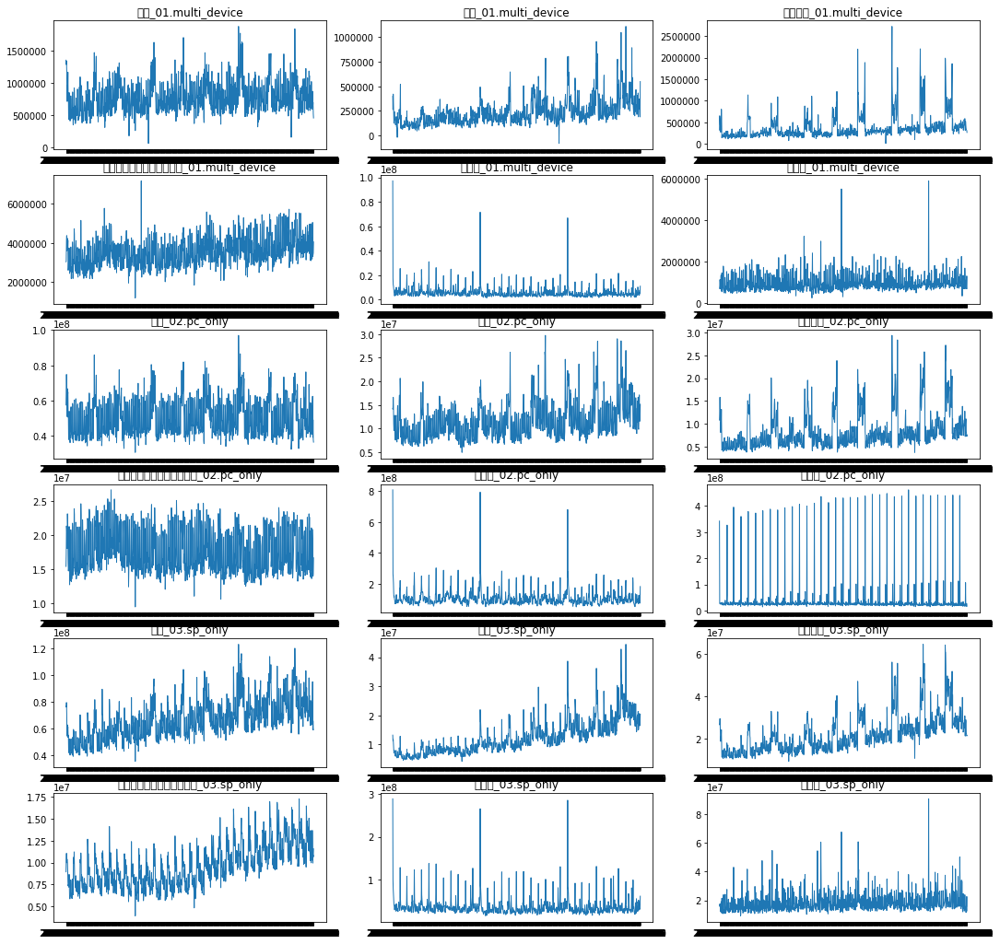

In [15]:
# データ可視化
fig = plt.figure(figsize=(18, 18))

plot_sales('dt', 'nontax_amount', category_list, data_list, 6, 3, 1)

In [16]:
#　売上のみのリスト作成
dataset_list = []
for data in data_list:
    dataset_list.append(data['nontax_amount'].values.astype('float32'))
dataset_list[0]

array([1352930., 1286002., 1341509., ...,  701436.,  522530.,  458573.],
      dtype=float32)

In [17]:
import numpy as np
from sklearn.preprocessing import MinMaxScaler

scaler_list = []
scaled_dataset_list = []

for data in dataset_list:
    scaler = MinMaxScaler(feature_range=(0, 1))
    # 前処理したデータを格納
    scaler_list.append(scaler.fit(data.reshape(-1, 1)))
    scaled_dataset_list.append(scaler.transform(data.reshape(-1, 1)))

In [18]:
# 売上平均値をdataset_listの長さ分記録するリスト作成
mean_list =[]
for data_df in dataset_list:
    mean_data = sum(data_df)/len(data_df)
    mean_data_list = [mean_data] * len(data_df)
    mean_list.append(mean_data_list)
    
scaled_mean_list = []
for data_df in scaled_dataset_list:
    scaled_mean_data = sum(data_df)/len(data_df)
    scaled_mean_data_list = [scaled_mean_data] * len(data_df)
    scaled_mean_list.append(scaled_mean_data_list)

In [19]:
import math
from sklearn.metrics import mean_squared_error

# 二乗平均誤差を計算する　
score_list = []
scaled_score_list =[]
for i in range(len(category_list)):
    score_list.append(math.sqrt(mean_squared_error(dataset_list[i][:], mean_list[i])))
    scaled_score_list.append(math.sqrt(mean_squared_error(scaled_dataset_list[i][:], scaled_mean_list[i])))

In [20]:
# 誤差の平均
print(f'score Av: {sum(score_list)/len(score_list)}')
print(f'scaled_score Av: {sum(scaled_score_list)/len(scaled_score_list)}')

score Av: 11802266.764342993
scaled_score Av: 0.12761844066472178


### まとめ
- 事業×デバイス別に、2016-01-01 ~ 2019-10-31の期間のデータの１日の売上の平均を算出した
- 売上実測値と平均値のRSMEを評価指標とした
- 誤差の平均をLSTM（Test Score Av: 0.1327355063733471）と比較すると少し平均の方が良い